In [1]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt
from importlib import reload
import numpy as np
import skimage.io as sk_io

In [2]:
tf.config.list_physical_devices(
)

2022-05-30 15:00:37.215153: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-30 15:00:37.266637: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-30 15:00:37.266749: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [2]:
path = "/home/julius/Desktop/new_try.png/"
image = sk_io.imread(path, as_gray=True)
number = 40
image[-number:, :] = 0
image[:number, :] = 0
image[:, -number:] = 0
image[:, :number] = 0
image_bkp = image
image = image[300:-300, 300:-300]
image = np.expand_dims(image, axis=2)

In [32]:
a = np.arange(6).reshape((3, 2))
a[0, :]

array([0, 1])

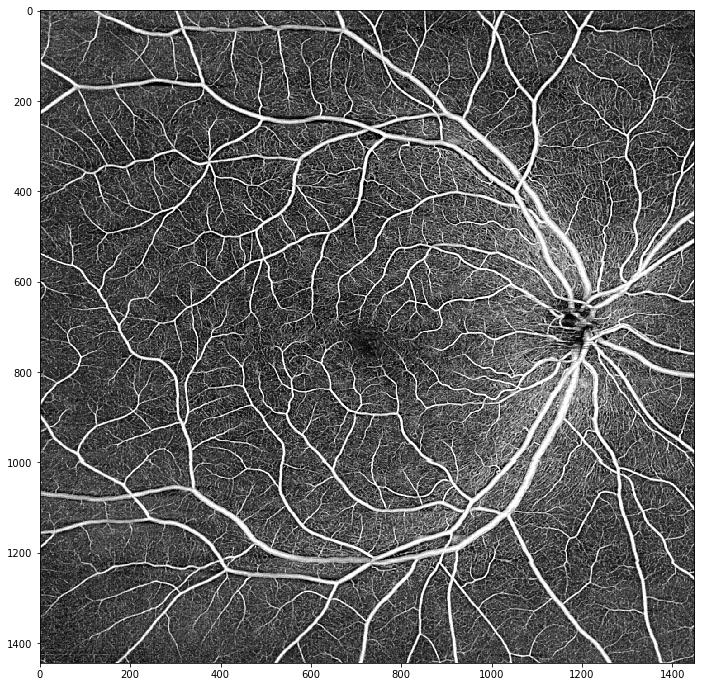

In [32]:
from hyperparameterStudy.image_dataset import ImageDataset
ImageDataset.load_file_list()

In [ ]:
from PIL import Image

reload(Postprocessor)
postprocessor = Postprocessor.Postprocessing(postprocessing_model=model)
rescaled_image, overlay_image = postprocessor.only_grad_cam_overlay(image, 0)
plt.figure(figsize=(14, 14))
from matplotlib import cm

overlay_image = Image.fromarray(np.uint8(cm.hot(postprocessor.top_10_percent(overlay_image))*255))
rescaled_image = Image.fromarray(np.uint8(cm.gray(rescaled_image)*255))

background = rescaled_image.convert("RGBA")
overlay = overlay_image.convert("RGBA")
new_img = Image.blend(background, overlay, 0.2)
plt.imshow(new_img, cmap="gray")

#plt.imshow(rescaled_image, cmap="gray")
#plt.imshow(postprocessor.top_10_percent(overlay_image), cmap="gist_heat", alpha=0.3)
plt.clim(np.min(overlay_image[overlay_image > 0]), np.max(overlay_image))

In [33]:
model_name = "acc_ave_pool_selu_lay4_no_drop_little_l2_flatten_n32_same_augment_strong_noise"
model_name = "acc_ave_pool_selu_lay6_little_drop_little_l2_flatten_n32_zeros_augment_noise"

In [33]:
import Postprocessor
import tensorflow.keras as k
import skimage.filters as sk_f

model_name = "acc_ave_pool_selu_lay7_little_drop_l2_flatten_n64_zeros_no augment_no_noise"
all_models_path = "/home/julius/dataspellprojects/oct-classifier/results/hyperparameter_study/best_model_image"
full_loss_model_path = os.path.join(all_models_path, model_name)
model = k.models.load_model(full_loss_model_path)

In [145]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

In [181]:
reload(Postprocessor)
postprocessor = Postprocessor.Postprocessing(postprocessing_model=model)
rescaled_image, overlay_image = postprocessor.only_grad_cam_overlay(image, 3)
overlay_image = postprocessor.top_10_percent(overlay_image)
ov_pp = np.pad(overlay_image, 300)

tf.Tensor([[-3.5842304]], shape=(1, 1), dtype=float32)


In [148]:
create_circular_mask(2044-600, 2048-600).shape

(1444, 1448)

In [182]:
overlay = Image.fromarray(np.uint8(cm.hot(postprocessor.top_10_percent(overlay_image))*255))
overlay = overlay.convert("RGBA")
overlay = np.array(overlay)
#overlay = overlay[create_circular_mask(2044-600, 2048-600)]
overlay = np.pad(overlay, ((300, 300), (300, 300), (0, 0)))
overlay[...,3] = (np.array(overlay)[...,0] > 10) * 255

In [159]:
1444*1448

2090912

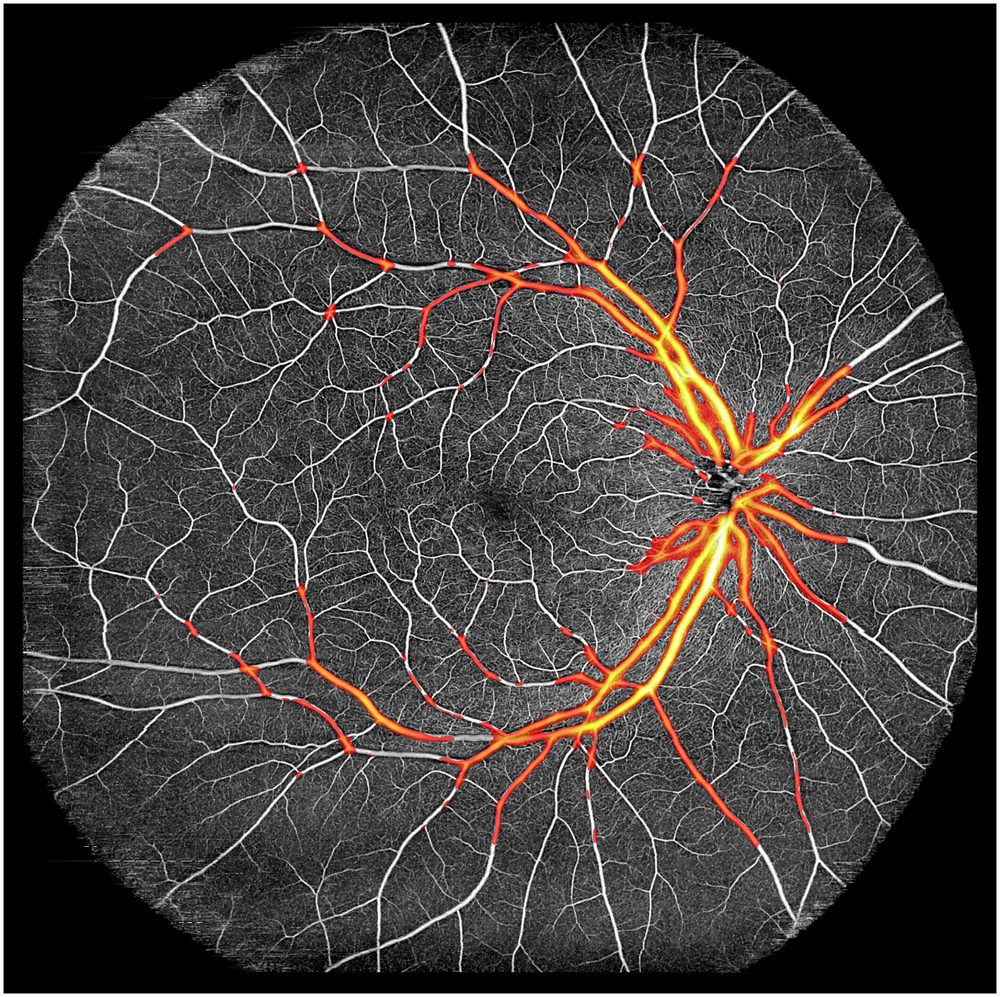

In [183]:
fig = plt.figure(figsize=(36, 36))
plt.imshow(image_bkp, cmap="gray")
plt.imshow(overlay, cmap="hot", alpha=0.7)
plt.clim(np.min(overlay[overlay > 0]), np.max(overlay))
plt.axis('off')
fig.savefig("/home/julius/submission2.png", bbox_inches='tight', pad_inches = 0)

In [120]:
overlay_image

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

(1960, 1956, 3)

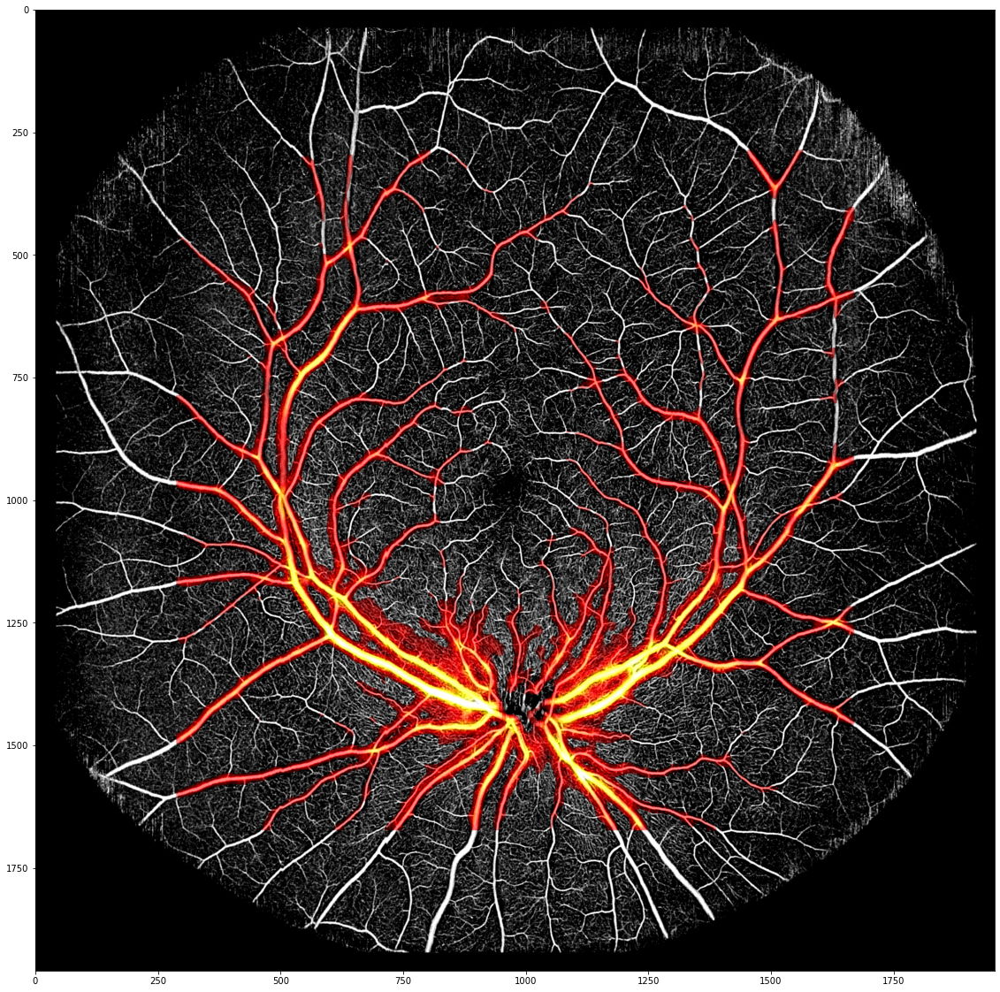

In [185]:
path = "/home/julius/Desktop/submission/8.png"
image = sk_io.imread(path)
plt.figure(figsize=(20, 20))
plt.imshow(image)
image.shape

In [16]:
import numpy as np
c = [(1.2, 2.1), 2.1]
d = [(3., 4.3), 4.5]
a = np.array([c, d])
np.save('data.npy', a) # save
new_num_arr = np.load('data.npy', allow_pickle=True) # load
new_num_arr

/tmp/ipykernel_137084/1631596001.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  a = np.array([c, d])


array([[(1.2, 2.1), 2.1],
       [(3.0, 4.3), 4.5]], dtype=object)

In [28]:
a = [("fge", 2), ("fds", 3), ("fds", 3)]
b = [4, 5, 6]

for d, e in zip(a, b):
    title, label = d
    print(title, label, e)

fge 2 4
fds 3 5
fds 3 6


In [29]:
sorted([[2, 5], [1, 6], [3, 0]])

[[1, 6], [2, 5], [3, 0]]

In [3]:
import hyperparameterStudy.image_dataset as im_ds
reload(im_ds)
path = "/home/julius/dataspellprojects/oct-classifier/data/diabetic_images/test_files/retina_1536x2048x2045x2_30672.png"
my_ds = im_ds.ImageDataset(data_list=[(path, 1)], validation_split=False, mil=True)
images = np.squeeze(my_ds.train_data)

2022-05-30 14:01:33.023126: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2022-05-30 14:01:33.023142: I tensorflow/core/profiler/lib/profiler_session.cc:125] Profiler session started.
2022-05-30 14:01:33.024882: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1630] Profiler found 1 GPUs
2022-05-30 14:01:33.025072: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcupti.so.11.2'; dlerror: libcupti.so.11.2: cannot open shared object file: No such file or directory
2022-05-30 14:01:33.055152: I tensorflow/core/profiler/lib/profiler_session.cc:143] Profiler session tear down.
2022-05-30 14:01:33.055284: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1764] CUPTI activity buffer flushed
2022-05-30 14:01:33.055568: I tensorflow/core/profiler/lib/profiler_session.cc:110] Profiler session initializing.
2022-05-30 14:01:33.055575: I tensorflow/core/profiler/lib/profiler_session.cc:125] Prof

Preprocessed 1.0 of 1


2022-05-30 14:01:33.126250: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-30 14:01:33.126850: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-30 14:01:33.127206: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-30 14:01:33.127498: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so retur

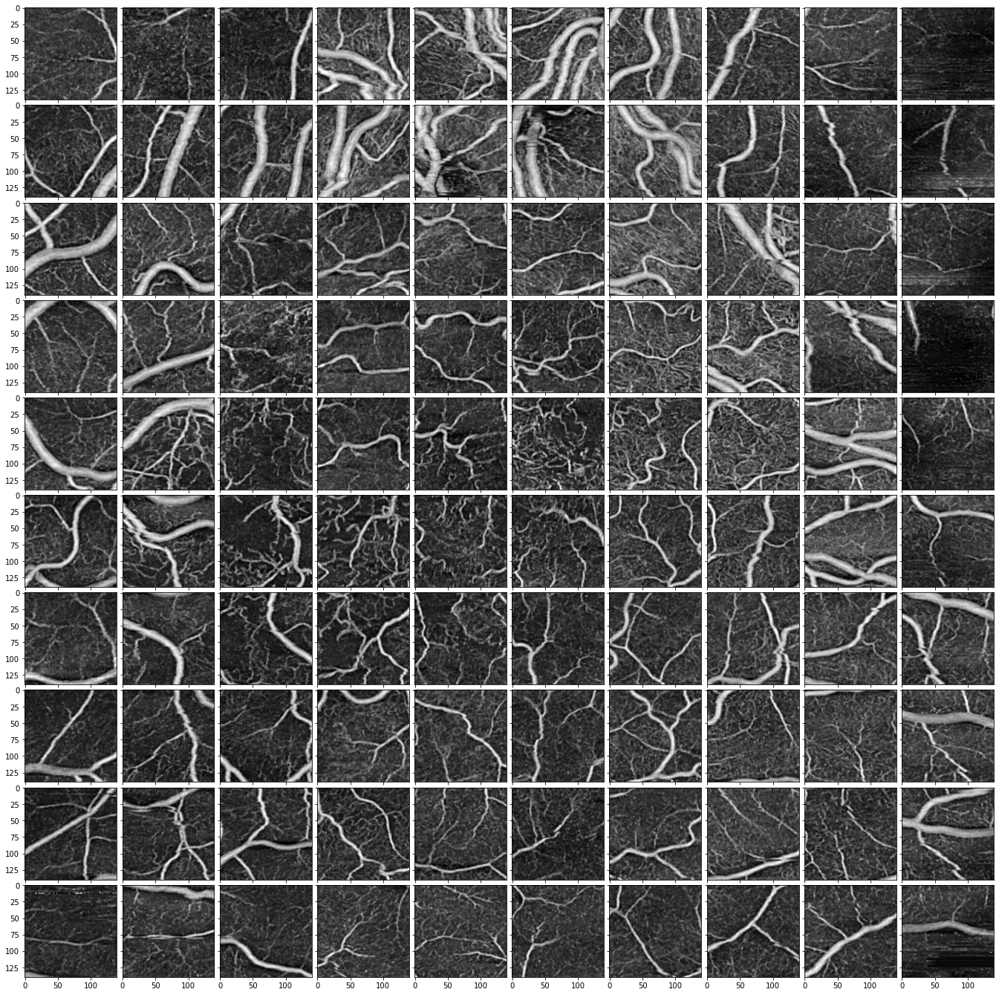

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(24., 24.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, range(images.shape[0])):
    # Iterating over the grid returns the Axes.
    ax.imshow(images[im, :, :], "gray")


plt.show()

In [5]:
import Visualization
reload(Visualization)
vis = Visualization.ImageVisualizer(results=np.expand_dims(np.array(list(range(100))), axis=1),
                              image_size=(1400, 1400),
                              instance_size=(140, 140, 10, 10),
                              background_image_path=path,
                              crop=(300 + 22, 300 + 24)
                              )
vis.plot_results_map()

ValueError: unknown file extension: 

In [48]:
a = np.array(list(range(100)))

In [13]:
import numpy as np
lala = np.ones((3, 3))

In [14]:
lala[:, 1] = 2



lala[:, 2] = 3



lala[2, :] = 4

In [16]:
lala.flatten()

array([1., 2., 3., 1., 2., 3., 4., 4., 4.])

In [9]:
lala = lala.flatten()
lala

array([1., 2., 3., 1., 2., 3., 1., 2., 3.])

In [17]:
lala.reshape(3, 3)

array([[1., 2., 3.],
       [1., 2., 3.],
       [4., 4., 4.]])

In [18]:
for elem in lala:
    print(elem)

[1. 2. 3.]
[1. 2. 3.]
[4. 4. 4.]
